# Correction Exercice 5 : Transfer Learning et Data Augmentation

**Dataset:** TF Flowers (TensorFlow Datasets) - 5 classes de fleurs

In [ ]:
# Imports
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import MobileNetV2, ResNet50, EfficientNetB0
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import time
from collections import Counter

TensorFlow: 2.21.0


## Tâche 1 : Chargement et Exploration

In [2]:
# 1. Charger TF Flowers avec TensorFlow Datasets
(train_ds, val_ds, test_ds), info = tfds.load(
    'tf_flowers',
    split=['train[:70%]', 'train[70%:85%]', 'train[85%:]'],
    with_info=True,
    as_supervised=True
)

num_classes = info.features['label'].num_classes
class_names = info.features['label'].names

print(f"Nombre de classes: {num_classes}")
print(f"Classes: {class_names}")

Nombre de classes: 5
Classes: ['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']


In [3]:
# 2. Analyser la distribution - compter les images
train_count = tf.data.experimental.cardinality(train_ds).numpy()
val_count = tf.data.experimental.cardinality(val_ds).numpy()
test_count = tf.data.experimental.cardinality(test_ds).numpy()

print(f"Train: {train_count}, Validation: {val_count}, Test: {test_count}")
print(f"Total: {train_count + val_count + test_count}")

Train: 2569, Validation: 551, Test: 550
Total: 3670


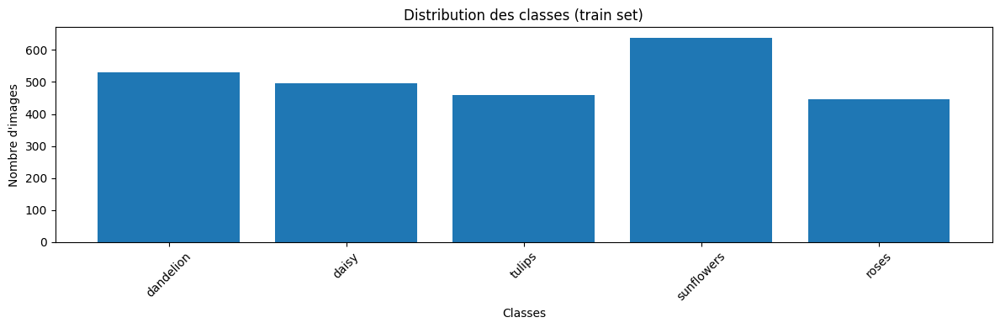

In [4]:
# 3. Analyser la distribution des classes
from collections import Counter

labels_list = []
for _, label in train_ds:
    labels_list.append(label.numpy())

label_counts = Counter(labels_list)

plt.figure(figsize=(12, 4))
plt.bar(range(len(label_counts)), list(label_counts.values()))
plt.xticks(range(len(class_names)), class_names, rotation=45)
plt.xlabel('Classes')
plt.ylabel('Nombre d\'images')
plt.title('Distribution des classes (train set)')
plt.tight_layout()
plt.show()

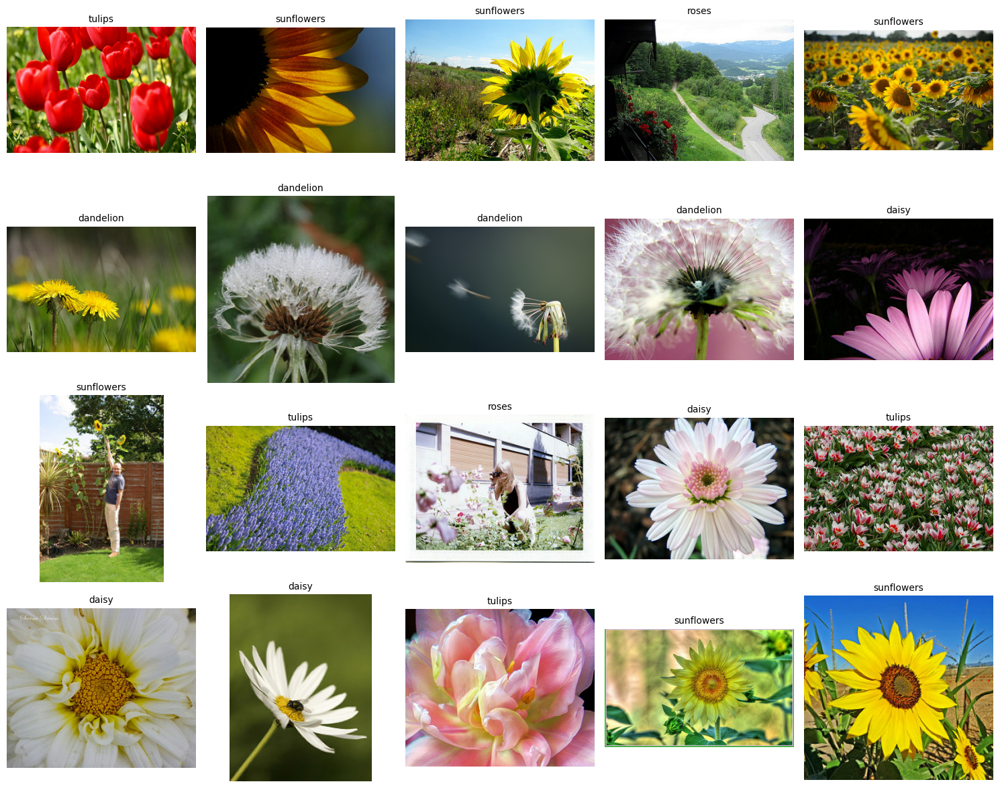

In [5]:
# 4. Visualiser 20 images aléatoires
plt.figure(figsize=(15, 12))
images_shown = 0

for img, label in train_ds.take(20):
    plt.subplot(4, 5, images_shown + 1)
    plt.imshow(img.numpy().astype('uint8'))
    plt.title(class_names[label.numpy()], fontsize=10)
    plt.axis('off')
    images_shown += 1

plt.tight_layout()
plt.show()

In [6]:
# 5. Afficher les informations
sample_img = next(iter(train_ds))[0]
print(f"Nombre de classes: {num_classes}")
print(f"Shape d'une image: {sample_img.shape}")
print(f"Nombre d'images train: {train_count}")
print(f"Nombre d'images validation: {val_count}")
print(f"Nombre d'images test: {test_count}")

Nombre de classes: 5
Shape d'une image: (333, 500, 3)
Nombre d'images train: 2569
Nombre d'images validation: 551
Nombre d'images test: 550


## Tâche 2 : Préparation avec Générateurs

In [7]:
# 1. Prétraitement : resize à 224x224 et normalisation
IMG_SIZE = 224

def preprocess(image, label):
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    image = image / 255.0
    return image, label

train_ds_processed = train_ds.map(preprocess).cache().shuffle(1000).batch(32).prefetch(tf.data.AUTOTUNE)
val_ds_processed = val_ds.map(preprocess).cache().batch(32).prefetch(tf.data.AUTOTUNE)
test_ds_processed = test_ds.map(preprocess).cache().batch(32).prefetch(tf.data.AUTOTUNE)

In [8]:
# 2. Data augmentation avec tf.keras.layers
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomTranslation(0.2, 0.2)
])


In [9]:
# 3. Vérifier le pipeline
for images, labels in train_ds_processed.take(1):
    print(f"Batch shape: {images.shape}")
    print(f"Labels shape: {labels.shape}")
    print(f"Pixel range: [{images.numpy().min():.2f}, {images.numpy().max():.2f}]")

Batch shape: (32, 224, 224, 3)
Labels shape: (32,)
Pixel range: [0.00, 1.00]


## Tâche 3 : Visualisation de l'Augmentation

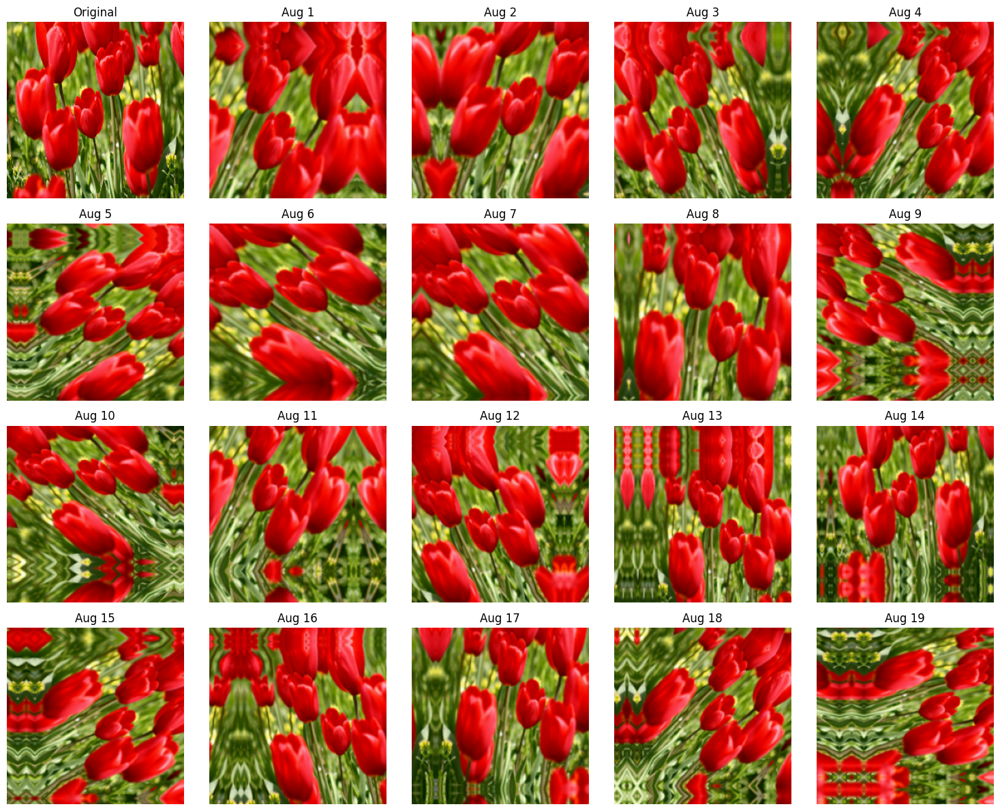

In [10]:
# 1-4. Visualiser 20 variations augmentées
sample_img = next(iter(train_ds))[0]
sample_img_resized = tf.image.resize(sample_img, (IMG_SIZE, IMG_SIZE))

plt.figure(figsize=(15, 12))

# Image originale
plt.subplot(4, 5, 1)
plt.imshow(sample_img_resized.numpy().astype('uint8'))
plt.title("Original")
plt.axis('off')

# 19 variations augmentées
for i in range(19):
    augmented = data_augmentation(tf.expand_dims(sample_img_resized, 0))
    plt.subplot(4, 5, i + 2)
    plt.imshow(augmented[0].numpy().astype('uint8'))
    plt.title(f"Aug {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Tâche 4 : Transfer Learning - Feature Extraction (MobileNetV2)

In [11]:
# 1-3. Charger MobileNetV2 et ajouter le classificateur
base_model = MobileNetV2(
    weights='imagenet',
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

# 2. Geler toutes les couches
base_model.trainable = False

model = keras.Sequential([
    data_augmentation,
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(num_classes, activation='softmax')
])

print(f"Classes: {num_classes}")

Classes: 5


In [12]:
# 4. Compiler
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [13]:
# 5. Entraîner 5 epochs
history = model.fit(
    train_ds_processed,
    epochs=5,
    validation_data=val_ds_processed,
    verbose=1
)

Epoch 1/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 31s 347ms/step - accuracy: 0.6921 - loss: 0.8213 - val_accuracy: 0.8022 - val_loss: 0.5056
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 26s 320ms/step - accuracy: 0.7976 - loss: 0.5341 - val_accuracy: 0.8348 - val_loss: 0.4469
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 26s 321ms/step - accuracy: 0.8279 - loss: 0.4649 - val_accuracy: 0.8276 - val_loss: 0.4311
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 26s 320ms/step - accuracy: 0.8334 - loss: 0.4388 - val_accuracy: 0.8512 - val_loss: 0.4122
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 27s 328ms/step - accuracy: 0.8381 - loss: 0.4266 - val_accuracy: 0.8730 - val_loss: 0.3422


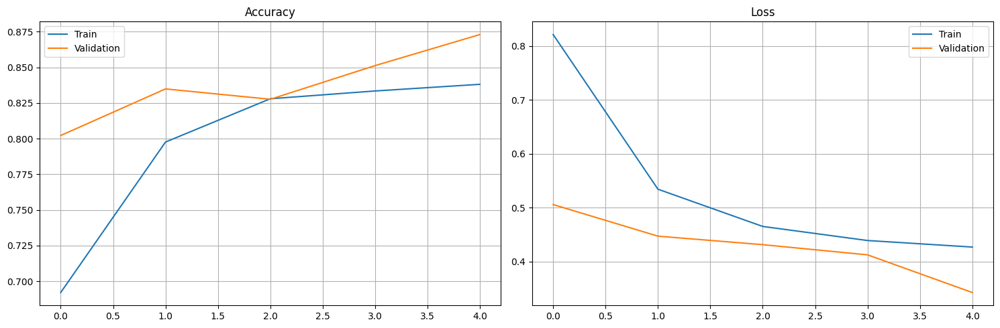

In [14]:
# 6. Afficher les courbes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(history.history['accuracy'], label='Train')
ax1.plot(history.history['val_accuracy'], label='Validation')
ax1.set_title('Accuracy')
ax1.legend()
ax1.grid()

ax2.plot(history.history['loss'], label='Train')
ax2.plot(history.history['val_loss'], label='Validation')
ax2.set_title('Loss')
ax2.legend()
ax2.grid()

plt.tight_layout()
plt.show()

## Tâche 5 : Comparaison de Modèles Pré-entraînés

In [15]:

def create_model(base_class, name):
    base = base_class(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
    base.trainable = False
    
    m = keras.Sequential([
        data_augmentation,
        base,
        layers.GlobalAveragePooling2D(),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(num_classes, activation='softmax')
    ])
    
    m.compile(
        optimizer=keras.optimizers.Adam(0.001),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return m

In [16]:
# 1. Créer ResNet50
model_resnet = create_model(ResNet50, 'ResNet50')

# 2. Entraîner 5 epochs
history_resnet = model_resnet.fit(
    train_ds_processed,
    epochs=5,
    validation_data=val_ds_processed,
    verbose=1
)

Epoch 1/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 74s 860ms/step - accuracy: 0.2596 - loss: 1.6240 - val_accuracy: 0.3721 - val_loss: 1.5077
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 66s 815ms/step - accuracy: 0.3017 - loss: 1.5518 - val_accuracy: 0.3448 - val_loss: 1.4997
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 66s 814ms/step - accuracy: 0.3305 - loss: 1.5309 - val_accuracy: 0.3448 - val_loss: 1.4979
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 66s 810ms/step - accuracy: 0.3305 - loss: 1.5277 - val_accuracy: 0.3267 - val_loss: 1.5218
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 67s 826ms/step - accuracy: 0.3239 - loss: 1.5255 - val_accuracy: 0.3321 - val_loss: 1.5022


In [17]:
# 1. Créer EfficientNetB0
model_efficient = create_model(EfficientNetB0, 'EfficientNetB0')

# 2. Entraîner 5 epochs
history_efficient = model_efficient.fit(
    train_ds_processed,
    epochs=5,
    validation_data=val_ds_processed,
    verbose=1
)

Epoch 1/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 39s 410ms/step - accuracy: 0.2160 - loss: 1.6341 - val_accuracy: 0.2668 - val_loss: 1.5891
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 32s 390ms/step - accuracy: 0.2413 - loss: 1.6074 - val_accuracy: 0.2668 - val_loss: 1.5957
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 32s 390ms/step - accuracy: 0.2413 - loss: 1.6033 - val_accuracy: 0.2668 - val_loss: 1.5945
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 32s 397ms/step - accuracy: 0.2421 - loss: 1.6048 - val_accuracy: 0.2668 - val_loss: 1.5929
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 32s 391ms/step - accuracy: 0.2456 - loss: 1.6028 - val_accuracy: 0.2668 - val_loss: 1.5939


In [18]:
# 3. Mesurer la vitesse d'inférence
sample_batch = next(iter(test_ds_processed))
sample_images = sample_batch[0][:100] if len(sample_batch[0]) >= 100 else sample_batch[0]

# MobileNetV2
start = time.time()
_ = model.predict(sample_images, verbose=0)
time_mobile = (time.time() - start) / len(sample_images) * 1000

# ResNet50
start = time.time()
_ = model_resnet.predict(sample_images, verbose=0)
time_resnet = (time.time() - start) / len(sample_images) * 1000

# EfficientNetB0
start = time.time()
_ = model_efficient.predict(sample_images, verbose=0)
time_efficient = (time.time() - start) / len(sample_images) * 1000


In [19]:
# 3. Tableau comparatif
comparison = pd.DataFrame({
    'Modèle': ['MobileNetV2', 'ResNet50', 'EfficientNetB0'],
    'Val Accuracy (%)': [
        history.history['val_accuracy'][-1] * 100,
        history_resnet.history['val_accuracy'][-1] * 100,
        history_efficient.history['val_accuracy'][-1] * 100
    ],
    'Params (M)': [
        model.count_params() / 1e6,
        model_resnet.count_params() / 1e6,
        model_efficient.count_params() / 1e6
    ],
    'Inférence (ms/img)': [time_mobile, time_resnet, time_efficient]
})

print(comparison.to_string(index=False))

        Modèle  Val Accuracy (%)  Params (M)  Inférence (ms/img)
   MobileNetV2         87.295824    2.422597           31.781778
      ResNet50         33.212340   23.850629           56.637853
EfficientNetB0         26.678765    4.214184           48.255742


In [20]:
# 4. Identifier le meilleur
best_idx = comparison['Val Accuracy (%)'].idxmax()
print(f"Meilleur modèle: {comparison.loc[best_idx, 'Modèle']}")

Meilleur modèle: MobileNetV2


## Tâche 6 : Évaluation Finale sur Test Set

In [21]:
# 1-2. Évaluer le meilleur modèle
test_loss, test_acc = model.evaluate(test_ds_processed, verbose=1)

print(f"\nTest Accuracy: {test_acc*100:.2f}%")
print(f"Test Loss: {test_loss:.4f}")

18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 218ms/step - accuracy: 0.8909 - loss: 0.3063

Test Accuracy: 89.09%
Test Loss: 0.3063


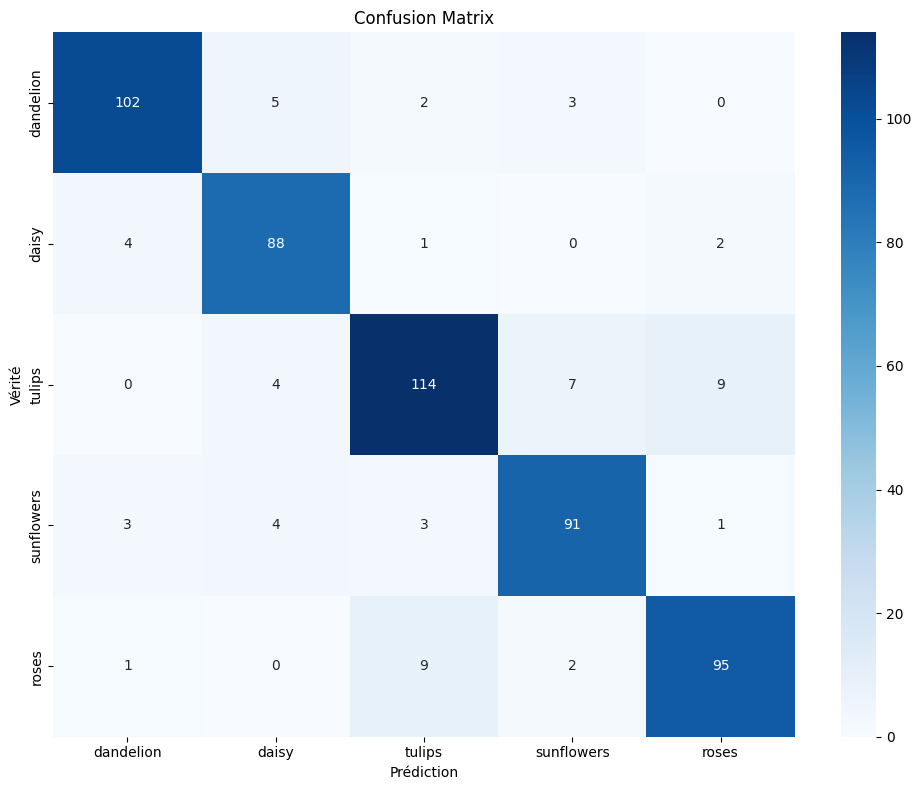

In [22]:
# 3. Confusion matrix
y_true = []
y_pred = []

for images, labels in test_ds_processed:
    predictions = model.predict(images, verbose=0)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predictions, axis=1))

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Prédiction')
plt.ylabel('Vérité')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

In [23]:
# 4. Classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))


Classification Report:
              precision    recall  f1-score   support

   dandelion       0.93      0.91      0.92       112
       daisy       0.87      0.93      0.90        95
      tulips       0.88      0.85      0.87       134
  sunflowers       0.88      0.89      0.89       102
       roses       0.89      0.89      0.89       107

    accuracy                           0.89       550
   macro avg       0.89      0.89      0.89       550
weighted avg       0.89      0.89      0.89       550



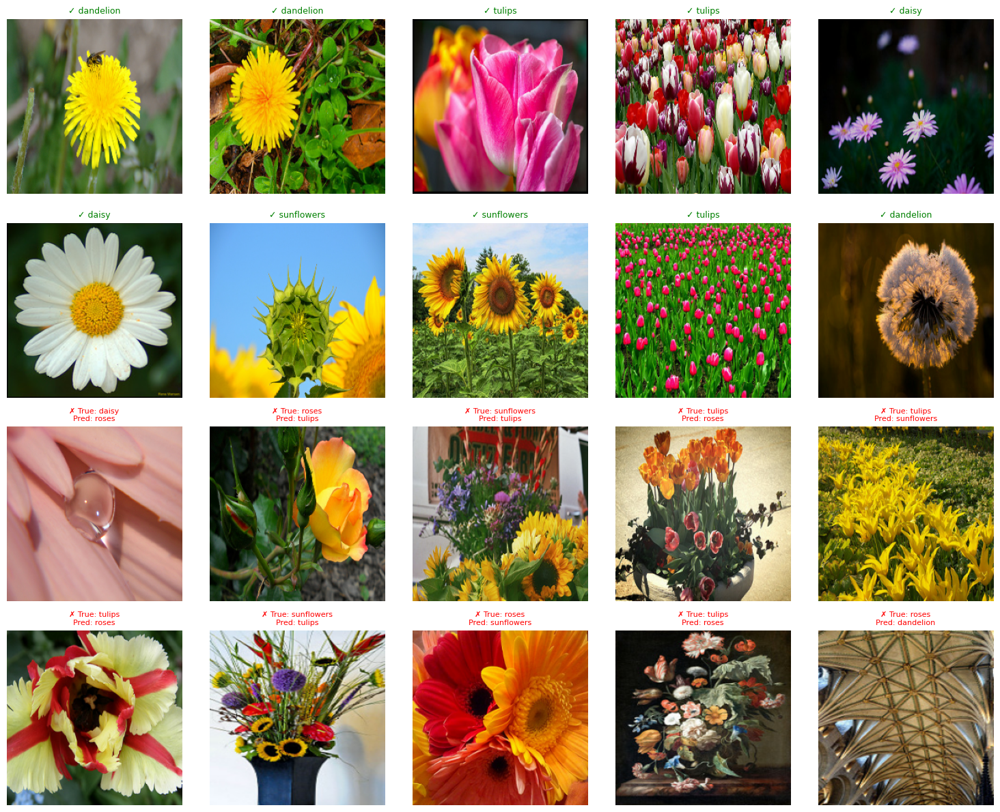

In [24]:
# 5. Visualiser 20 prédictions (10 correctes + 10 erreurs)
correct_idx = [i for i, (t, p) in enumerate(zip(y_true, y_pred)) if t == p]
wrong_idx = [i for i, (t, p) in enumerate(zip(y_true, y_pred)) if t != p]

# Récupérer les images du test set
test_images = []
for images, _ in test_ds_processed:
    test_images.extend(images.numpy())

fig, axes = plt.subplots(4, 5, figsize=(15, 12))
axes = axes.ravel()

# 10 correctes
for i in range(min(10, len(correct_idx))):
    idx = correct_idx[i]
    axes[i].imshow(test_images[idx])
    axes[i].set_title(f"✓ {class_names[y_true[idx]]}", color='green', fontsize=9)
    axes[i].axis('off')

# 10 erreurs
for i in range(min(10, len(wrong_idx))):
    idx = wrong_idx[i]
    axes[i+10].imshow(test_images[idx])
    axes[i+10].set_title(
        f"✗ True: {class_names[y_true[idx]]}\nPred: {class_names[y_pred[idx]]}",
        color='red', fontsize=8
    )
    axes[i+10].axis('off')

plt.tight_layout()
plt.show()